**Nama**            : Fawwaz Rif'at Revista

**NIU**             : 565782

**Mata Kuliah**     : Pengolahan dan Analisis Citra Digital

**Tugas**           : Assignment 03 (Morphological Processing)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# Jenis-jenis kernel (6 jenis)
def square_kernel(size=3):
    return np.ones((size, size), dtype=int)

def circular_kernel(radius=1):
    size = radius * 2 + 1
    kernel = np.zeros((size, size), dtype=int)
    center = radius
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 <= radius**2 + 0.5:
                kernel[i, j] = 1
    return kernel

def cross_kernel():
    return np.array([[0,1,0],
                     [1,1,1],
                     [0,1,0]])

def x_kernel():
    return np.array([[1,0,1],
                     [0,1,0],
                     [1,0,1]])

def t_kernel():
    return np.array([[1,1,1],
                     [0,1,0],
                     [0,1,0]])

def l_kernel():
    return np.array([[1,0,0],
                     [1,0,0],
                     [1,1,1]])

# Segementation by thresholding denga Otsu
def otsu_threshold(img):
    pixel_counts, _ = np.histogram(img.ravel(), bins=256, range=(0, 256))
    total_pixels = img.size
    current_max, threshold = 0, 0
    sum_total = np.dot(np.arange(256), pixel_counts)
    sum_background, weight_background = 0, 0
    for t in range(256):
        weight_background += pixel_counts[t]
        if weight_background == 0:
            continue
        weight_foreground = total_pixels - weight_background
        if weight_foreground == 0:
            break
        sum_background += t * pixel_counts[t]
        mean_b = sum_background / weight_background
        mean_f = (sum_total - sum_background) / weight_foreground
        var_between = weight_background * weight_foreground * (mean_b - mean_f) ** 2
        if var_between > current_max:
            current_max = var_between
            threshold = t
    return threshold

def threshold_segmentation(img, thresh):
    binary = np.zeros_like(img)
    binary[img >= thresh] = 1
    return binary

# Fungsi padding
def pad_image(img, pad):
    return np.pad(img, ((pad, pad), (pad, pad)), mode='constant', constant_values=0)

# Fungsi morphological processing
def erosion(img, se):
    se_size = se.shape[0]
    pad = se_size // 2
    padded = pad_image(img, pad)
    result = np.zeros_like(img)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            region = padded[i:i+se_size, j:j+se_size]
            if np.array_equal(region[se == 1], se[se == 1]):
                result[i, j] = 1
    return result

def dilation(img, se):
    se_size = se.shape[0]
    pad = se_size // 2
    padded = pad_image(img, pad)
    result = np.zeros_like(img)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            region = padded[i:i+se_size, j:j+se_size]
            if np.any(region[se == 1] == 1):
                result[i, j] = 1
    return result

def opening(img, se):
    return dilation(erosion(img, se), se)

def closing(img, se):
    return erosion(dilation(img, se), se)


# def log_transform(image):
#     """Transformasi logaritma untuk meningkatkan detail area gelap."""
#     image = image.astype(float)
#     c = 255 / np.log(1 + np.max(image))
#     log_img = c * np.log(1 + image)
#     return np.uint8(log_img)


# Fungsi untuk menampilkan hasil segmentasi otsu dan morphological
def process_image(path, kernel_type="square"):

    # 1. Membaca sekaligus mengubah menjadi gambar grayscale
    image = np.array(Image.open(path).convert('L'))

    # preprocessing dengan log transform
    #image = log_transform(image)

    # 2. Menghitung threshold Otsu
    otsu_t = otsu_threshold(image)
    print(f"Otsu Threshold = {otsu_t}")

    # 3. Segmentasi biner berdasarkan threshold
    segmented = threshold_segmentation(image, otsu_t)

    # Memastikan agar background selalu berwarna hitam
    if np.mean(segmented) > 0.5:
      segmented = 1 - segmented

    # 4. Memilih jenis-jenis kernel
    if kernel_type == "square":
        se = square_kernel(3)
    elif kernel_type == "circular":
        se = circular_kernel(1)
    elif kernel_type == "cross":
        se = cross_kernel()
    elif kernel_type == "x":
        se = x_kernel()
    elif kernel_type == "t":
        se = t_kernel()
    elif kernel_type == "l":
        se = l_kernel()
    else:
        raise ValueError("Kernel type tidak dikenal!")

    # 5. Morphological processing secara manual
    eroded = erosion(segmented, se)
    dilated = dilation(segmented, se)
    opened = opening(segmented, se)
    closed = closing(segmented, se)

    # 6. Menampilkan hasil dari input awal hingga morphological processing
    plt.figure(figsize=(14, 8))
    plt.subplot(2, 3, 1); plt.imshow(image, cmap='gray'); plt.title(f"Original Grayscale\nKernel: {kernel_type}"); plt.axis('off')
    plt.subplot(2, 3, 2); plt.imshow(segmented, cmap='gray'); plt.title("Segmented (Otsu)"); plt.axis('off')
    plt.subplot(2, 3, 3); plt.imshow(eroded, cmap='gray'); plt.title("Erosion"); plt.axis('off')
    plt.subplot(2, 3, 4); plt.imshow(dilated, cmap='gray'); plt.title("Dilation"); plt.axis('off')
    plt.subplot(2, 3, 5); plt.imshow(opened, cmap='gray'); plt.title("Opening"); plt.axis('off')
    plt.subplot(2, 3, 6); plt.imshow(closed, cmap='gray'); plt.title("Closing"); plt.axis('off')
    plt.tight_layout()
    plt.show()

    return otsu_t, segmented, eroded, dilated, opened, closed

# **Gambar 1**

Otsu Threshold = 119


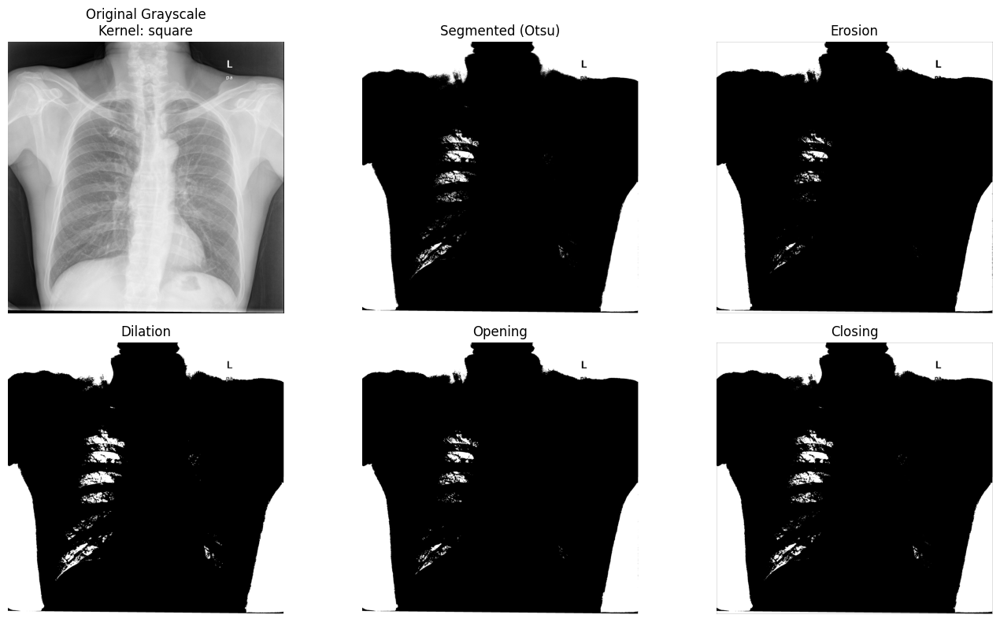

Otsu Threshold = 119


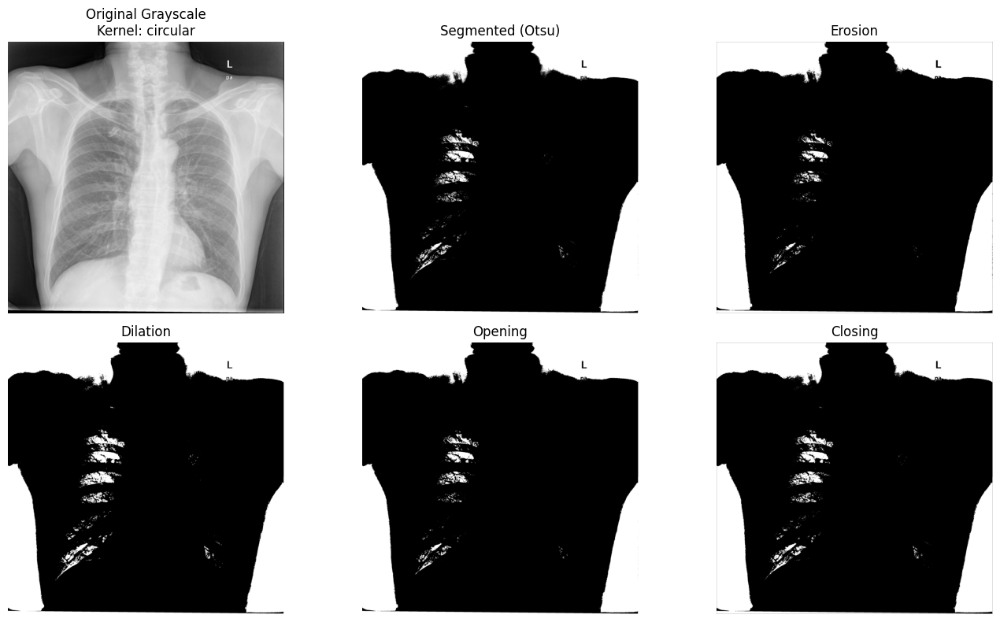

Otsu Threshold = 119


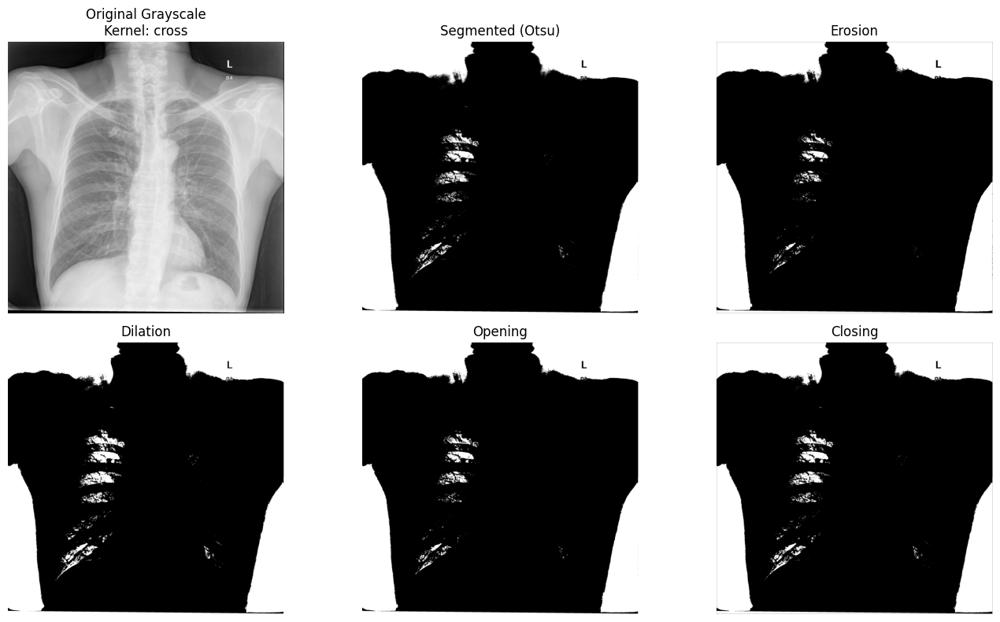

Otsu Threshold = 119


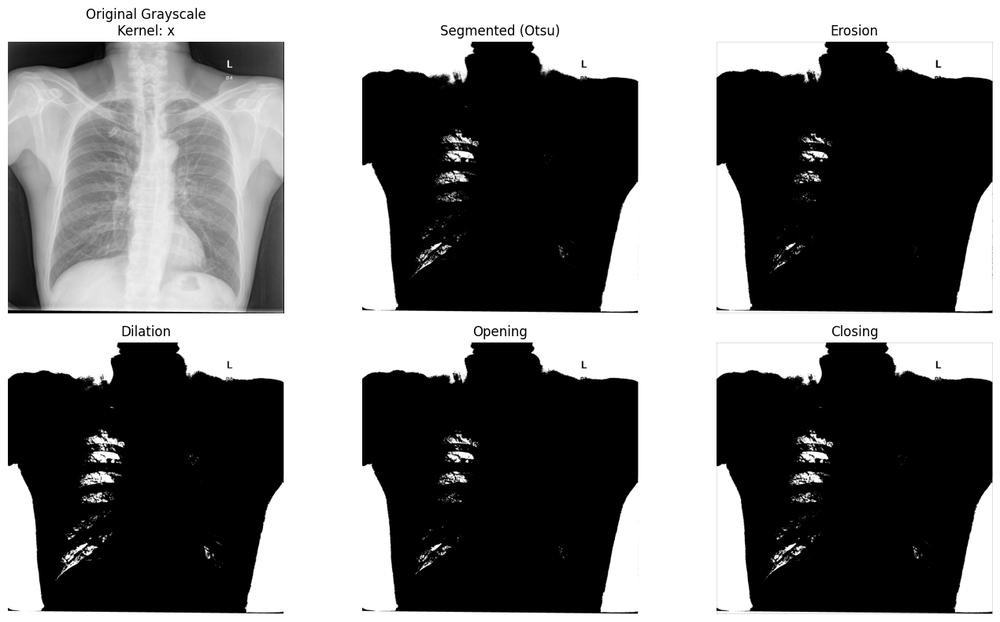

Otsu Threshold = 119


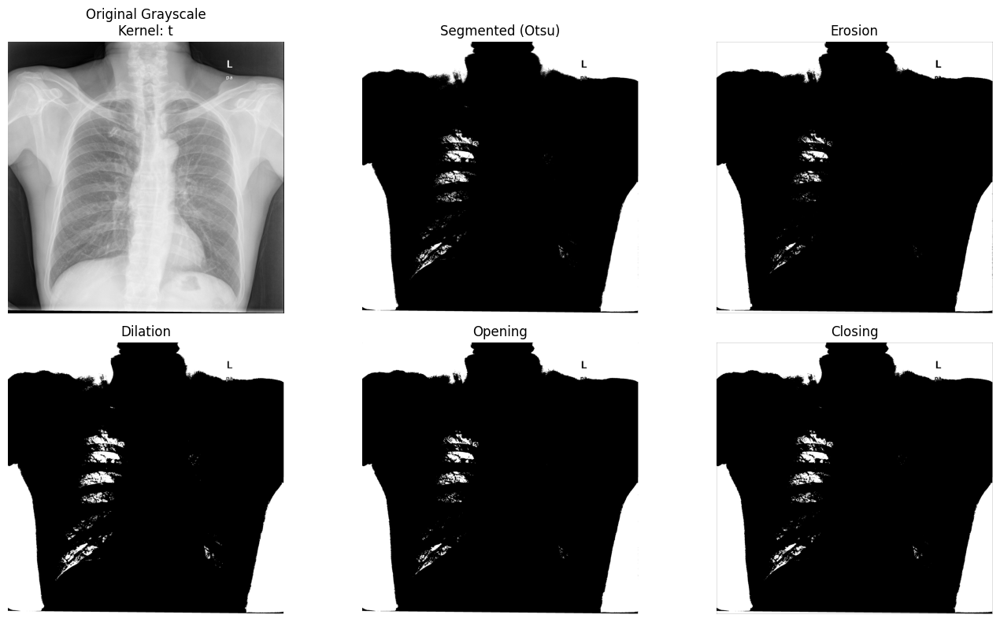

Otsu Threshold = 119


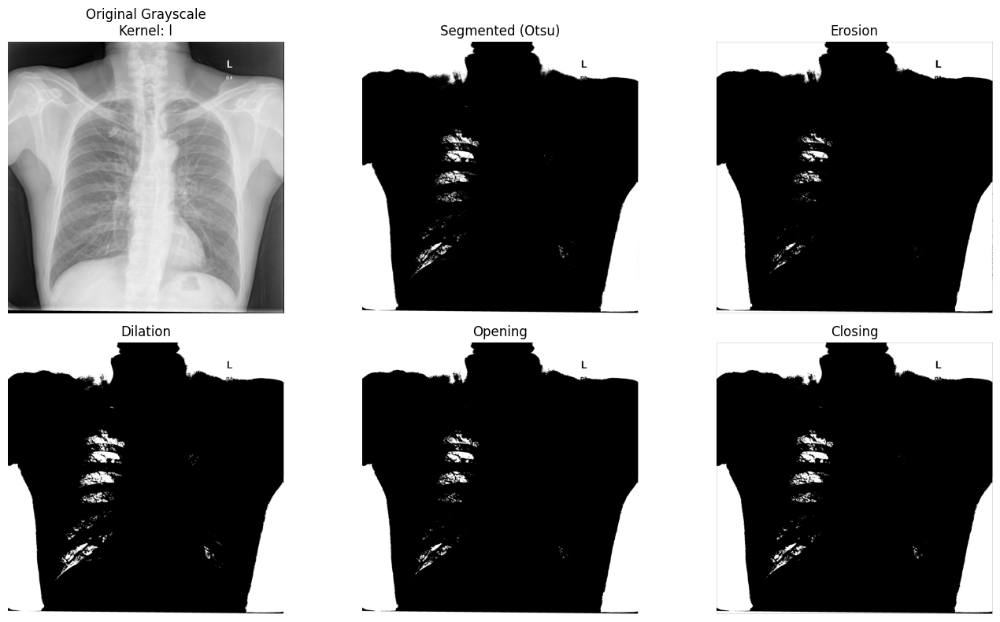

(119,
 array([[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 1, ..., 1, 1, 0],
        [0, 1, 1, ..., 1, 1, 0],
        ...,
        [0, 1, 1, ..., 1, 1, 0],
        [0, 1, 1, ..., 1, 1, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [0, 1, 1, ..., 1, 1, 1]], dtype=uint8),
 array([[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [0, 0, 1, ..., 1, 1, 1],
        [0, 0, 1, ..., 1, 1, 1]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 1, ..., 1, 1, 0],
        [0, 1, 1, ..., 1

In [ ]:
process_image("1001.png", kernel_type="square")     # kernel persegi
process_image("1001.png", kernel_type="circular")   # kernel lingkaran
process_image("1001.png", kernel_type="cross")      # kernel cross
process_image("1001.png", kernel_type="x")          # kernel X
process_image("1001.png", kernel_type="t")          # kernel T
process_image("1001.png", kernel_type="l")          # kernel L

# **Gambar 2**

Otsu Threshold = 113


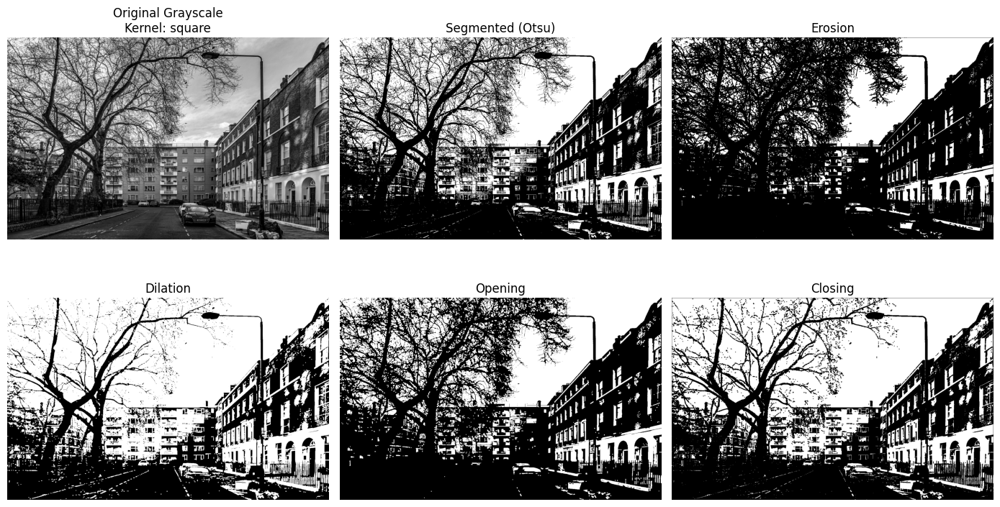

Otsu Threshold = 113


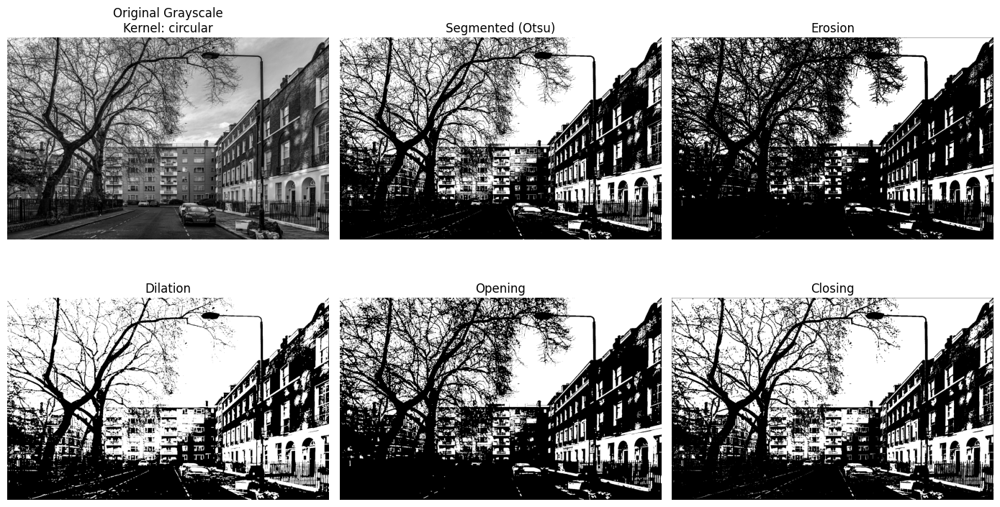

Otsu Threshold = 113


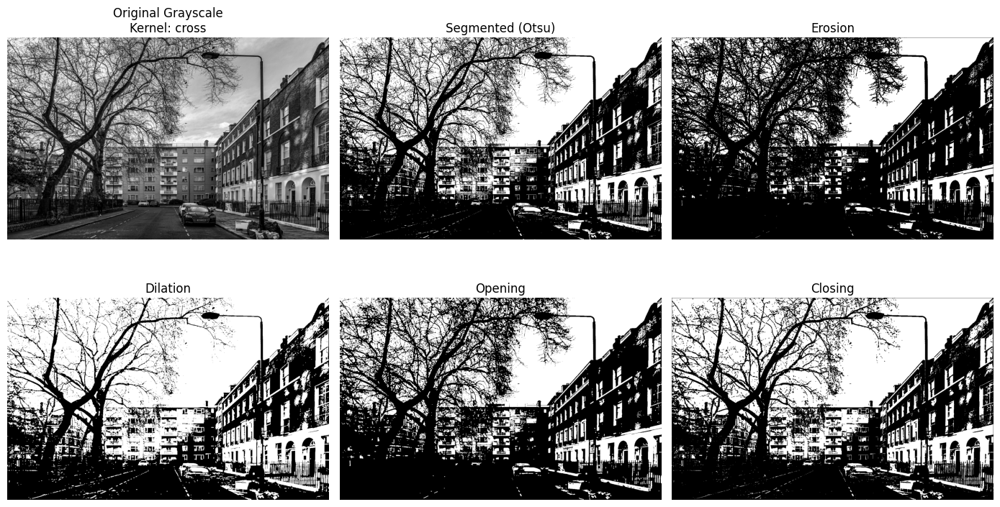

Otsu Threshold = 113


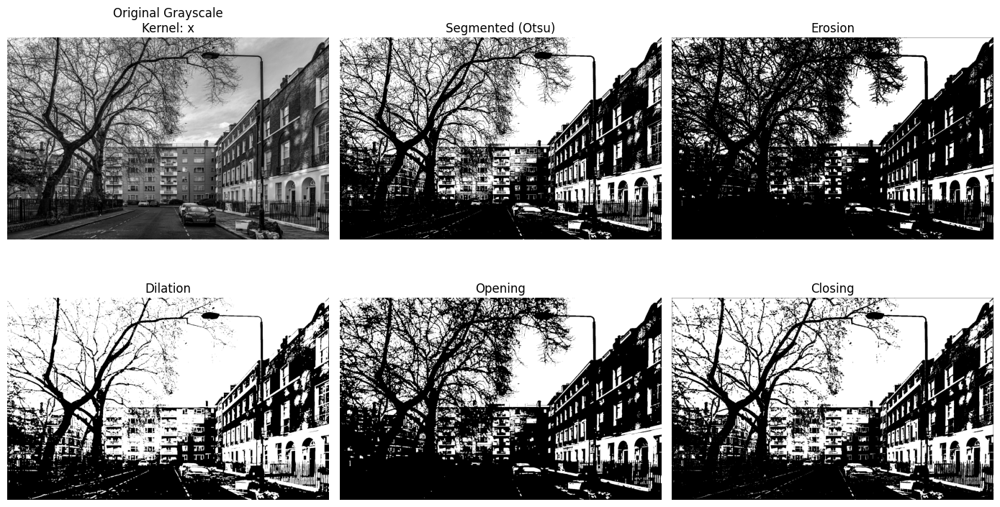

Otsu Threshold = 113


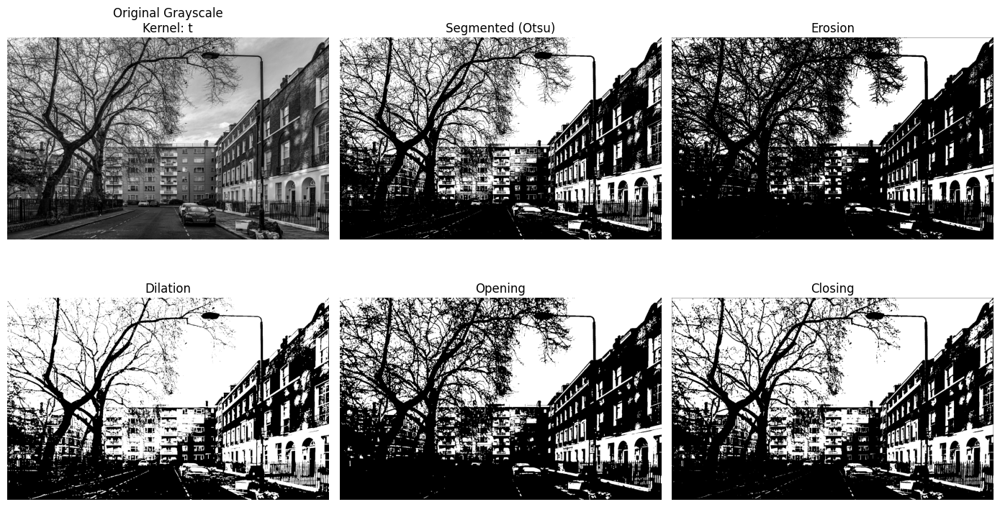

Otsu Threshold = 113


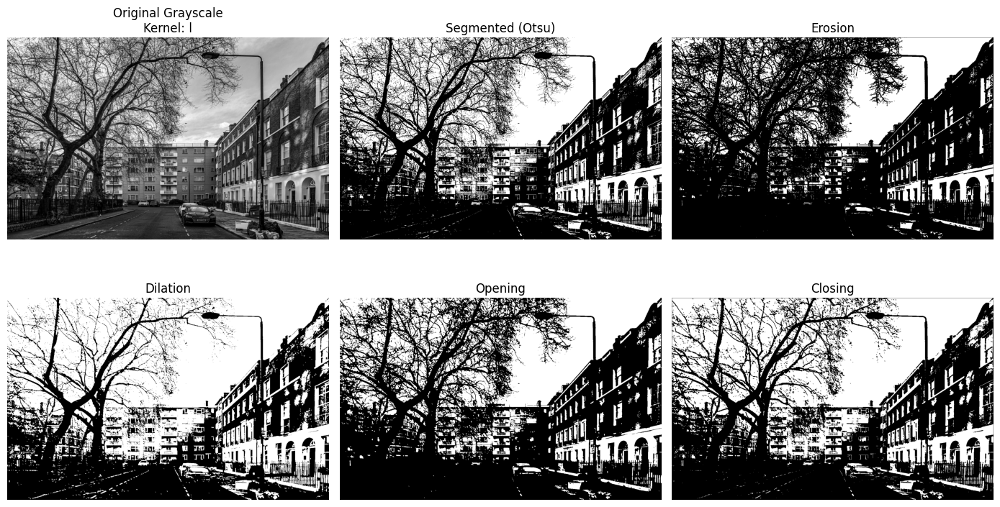

(113,
 array([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 1, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[1, 1, 1, ..., 1, 0, 0],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 0, 0, 1],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        [0, 1, 1, ..., 0

In [3]:
process_image("town.jpg", kernel_type="square")     # kernel persegi
process_image("town.jpg", kernel_type="circular")   # kernel lingkaran
process_image("town.jpg", kernel_type="cross")      # kernel cross
process_image("town.jpg", kernel_type="x")          # kernel X
process_image("town.jpg", kernel_type="t")          # kernel T
process_image("town.jpg", kernel_type="l")          # kernel L

# **Gambar 3**

Otsu Threshold = 195


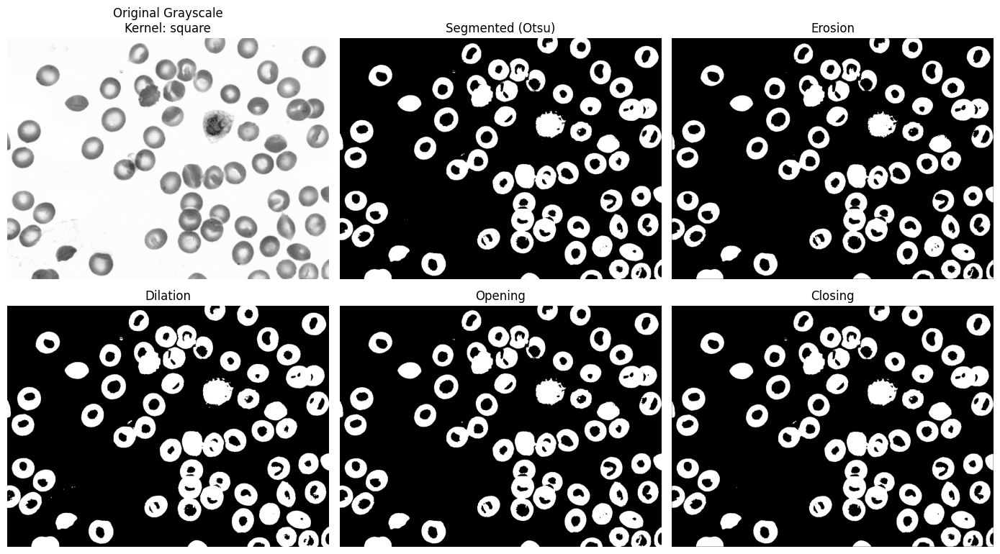

Otsu Threshold = 195


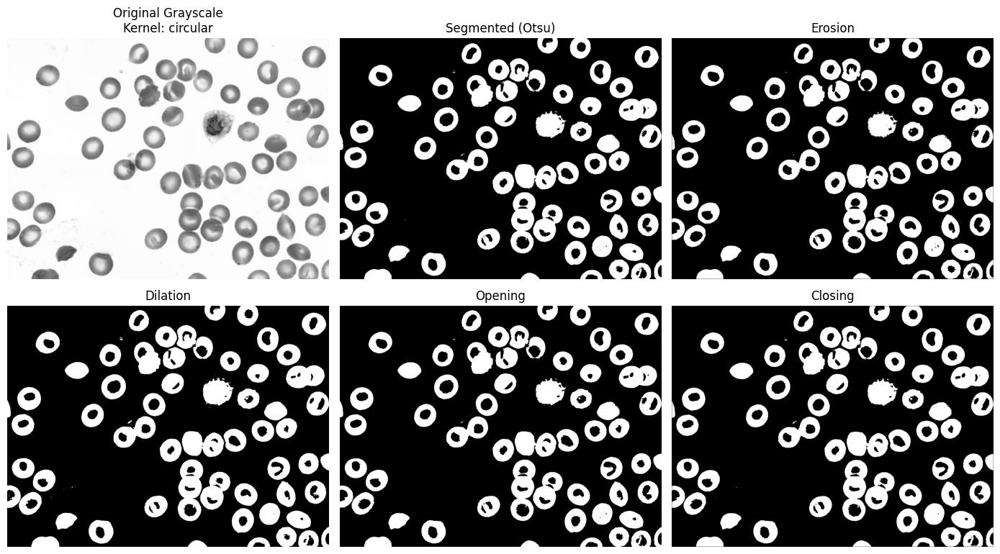

Otsu Threshold = 195


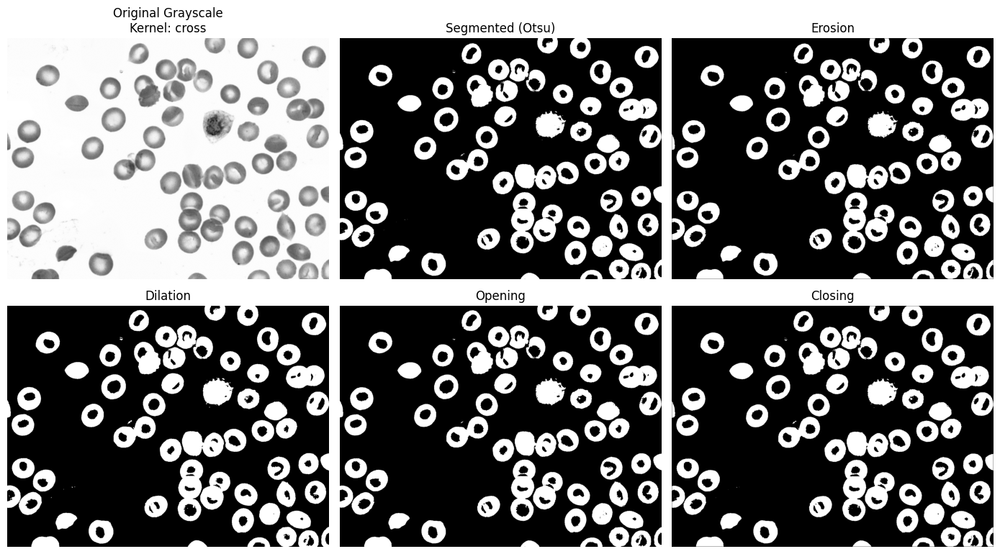

Otsu Threshold = 195


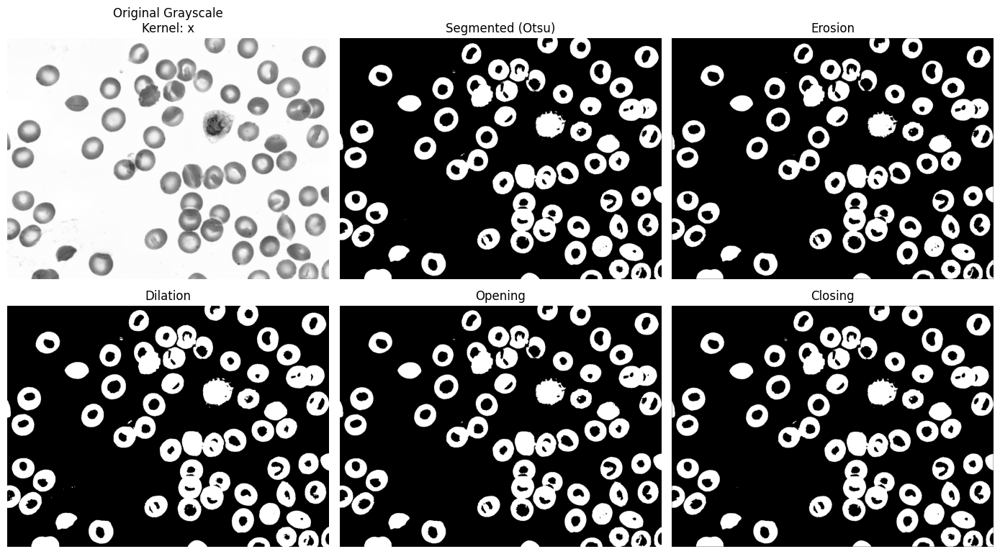

Otsu Threshold = 195


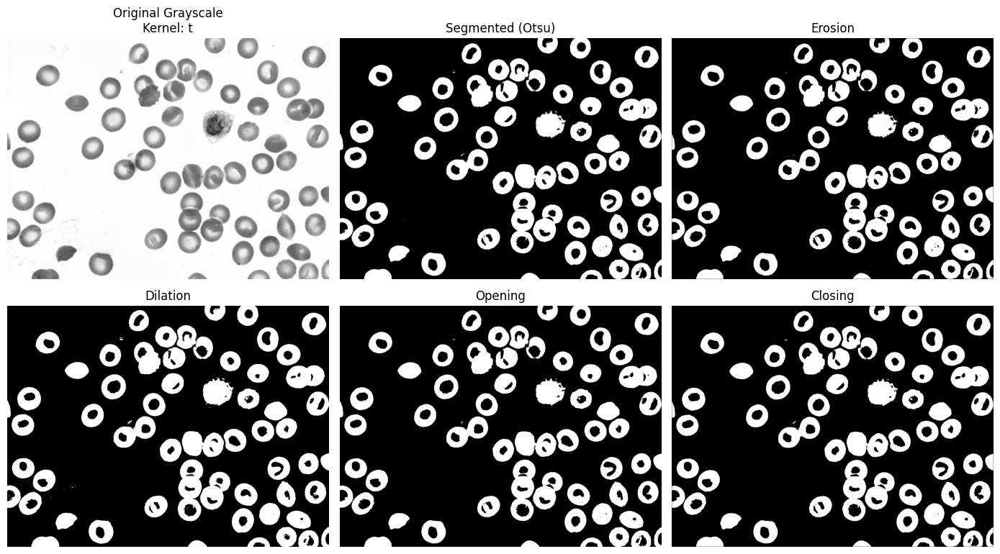

Otsu Threshold = 195


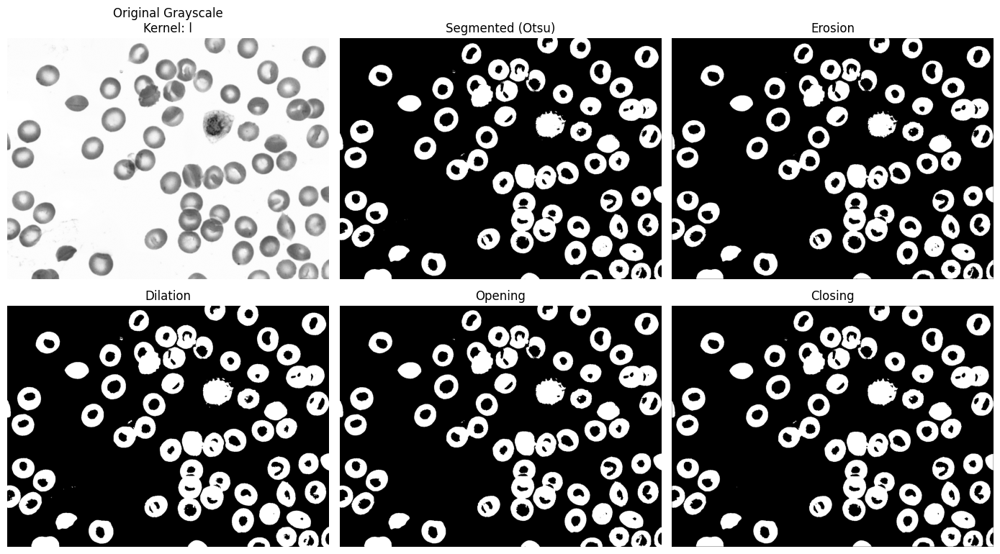

(195,
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 0],
        [0, 0, 0, ..., 1, 1, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0

In [4]:
process_image("blood.png", kernel_type="square")     # kernel persegi
process_image("blood.png", kernel_type="circular")   # kernel lingkaran
process_image("blood.png", kernel_type="cross")      # kernel cross
process_image("blood.png", kernel_type="x")          # kernel X
process_image("blood.png", kernel_type="t")          # kernel T
process_image("blood.png", kernel_type="l")          # kernel L

# **Analisis**


Eksperimen :
1. Morphological processing dilakukan dengan padding
2. Menggunakan Otsu method untuk segmentasi
3. Mencoba berbagai jenis kernel untuk tiap gambar
4. Morpohological processing yang dilakukan adalah erosion, dilation, opening, dan closing.

Hasil dan analisis:

Gambar 1 :

Gambar 1 adalah rontgen dada. Secara visual, tidak terdapat perbedaan yang signifikan pada tiap jenis kernel yang berbeda, dimana perbedaan hasil morphological dengan kernel yang berbeda sulit diidentifikasi secara visual. Bagian yang dapat disegmentasi dengan baik hany bagian kanan paru karena pada gambar rontgen tersebut, bagian kanan paru memiliki warna hitam yang lebih banyak, sedangkan bagian kirinya tertutup oleh jantung yang menyebabkan warna putihnya lebih banyak. Sebenarnya Gambar 1 tidak dapat dianalisis terlalu mendalam karena proses segmentasi parunya tidak berhasil, tetapi erosion adalah satu-satunya metode yang berhasil untuk menghilangkan noise pada paru bagian kiri, dimana berdasarkan hasil segmentasi otsu masih terdapat noise.

Gambar 2 :

Gambar 2 adalah gambar pemandangan kota yang memiliki banyak objek didalamnya, seperti pohon, mobil gedung, tiang listrik, dll. Secara visual, juga tidak terdapat perbedaan yang signifikan pada tiap jenis kernel yang berbeda, dimana perbedaan hasil morphological dengan kernel yang berbeda sulit diidentifikasi secara visual. Gambar 2 adalah gambar yang paling mudah untuk menemukan perbedaan pada hasil segmentasi dan morphological processingnya karena terdapat banyak objek pada gambar tersebut. Hasil morphological dengan dilation memberikan hasil yang lebih baik untuk segmentasi mobil dan pohon, dapat dilihat bahwa objek mobil dan pohon terlihat lebih jelas pada gamba hasi dilation, tetapi ranting pohon yang berukuran kecil pada dilation sedikit kurang jelas karena arahnya ke langit yang juga berwarna putih setelah hasil segmentasinya. Jadi pada Gambar 2, dilation memberikan hasil segmentasi yang lebih baik dibandingkan otsu secara visual.

Gambar 3 :

Gambar 3 adalah gambar sel darah merah. Secara visual, gambar sel darah merah tersebut juga tidak terdapat perbedaan yang signifikan pada tiap jenis kernel yang berbeda, dimana perbedaan hasil morphological dengan kernel yang berbeda sulit diidentifikasi secara visual. Perbedaan pada tiap hasil segmentasi (otsu dan morphological) juga tidak mudah diidentifikasi seperti pada gambar 2. Namun, jika dilihat dengan lebih detail lagi, perbedaannya terletak pada hasil segmentasi (pemisahan) tiap sel, dimana erosian menunjukkan hasil segmentasi yang sedikit lebih baik karena dapat memberikan jarak antar sel yang lebih jauh, sehingga lebih mudah jika ingin menghitung jumlah selnya.